# Table of content

1. Problem Statement
2. Project Objective
3. Dataset Information
4. Data preprocessing
    1. Load the data.    2.  Perform Exploratory Data Analysis
        1. Confirm the number of records in the data.
        2. Checking for the Data types.
        3. Check for missing data, invalid and duplicate entries.
        4. Examining correlation between independent and target features (weekly sales)
        5. Checking the data if countinuous features are following the Gaussian distribution.
        6. Checking for potential outliers in the datas.
5. Time Series Analysis.
   1. Stationarity testing.
   2. Visualization of the time series trends and seasonality.
6. Building Sales Forecasting Model using Facebook Prophet.
7. Building Sales Prediction Modelel
   1. Linear Regression
   2. Random Forest Regressor Model
   3. Simple Neural Netwo Model.
8. Comparision of Actual Sales data with the predicted sales data derived from the best Models.

## Problem Statement

A Retail store that has multiple outlets across the country are facing issues in managing the inventory - to match the demand with respect to supply. You are a data scientist, who has to come up with useful insights using the data and make prediction models to forecast the sales for X number of days.


## Project Objective

Building a predictive model using the given sales data to enable stakeholders to anticipate demand fluctuations, also to understand consumer behavior. Thereby empowering strategic decision-making for inventory stocking and sales optimization.

1. Using the data provided, come up with useful insight that can be used by each of the stores to improve in various areas.
2. Forecast the sales for each store for the next 12 weeks

## Dataset Information:

The Walmart csv contains 6435 rows and 8 columns. The Dataset used int he analysis was collected from Kaggle, a platform hosting various datasets contibuted by the community. The Dataset i have used here is titles (Walmart.csv) and it is downloaded from (intellipaat DSAI Evaluation Quiz/ capstone project).

This Data is the historical data that covers the sales from 2010-01-10 till 2012-12-10. The following feilds are mentioned withing the dataset.

1. Store -- the store number
2. Date -- week of the sales
3. Weekly Sales -- amount of sales of the given store
4. Holiday Flag -- whether the week has holiday or not. 1 denotes week has holiday, 0 being non-holiday week
5. Temprature -- Holds the temprature on the day of sales.
6. Fule Price -- Price of the fuel on that perticular day of sales
7. CPI -- Consumer price index on the day of sale
8. Unemployment -- Rate of unemployment

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

## Data Preprocessing Steps and Inspiration
The preprocessing of the data includes the following steps:

1. Step 1: Load the data.
2. Step 2: Perform Exploratory Data Analysis.
   1. Confirm number of records in the data and how they are distributed.
   2. Check for there Data types
   3. Check for missing data, invalid and duplicate entries
   4. Examining correlation between independent and target features (weekly sales)
   5. Checking the countinuous features if they follow the normal distribution.
   6. Check for outliers that could potentially distort the predictions Model.
3. Step 3: Model Prediction, Using two approaches:
   1. Time Series Analysis (Facebook Prophet)
   2. Regression Models
4. Step 4. Forecast
5. Step 5. Comapre Results from the different Models.

### Step 1. Loading the Dataset

In [2]:
walmart = pd.read_csv('Walmart.csv', encoding='latin', on_bad_lines='skip')
walmart.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106


In [3]:
walmart.tail()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
6430,45,28-09-2012,713173.95,0,64.88,3.997,192.013558,8.684
6431,45,05-10-2012,733455.07,0,64.89,3.985,192.170412,8.667
6432,45,12-10-2012,734464.36,0,54.47,4.000,192.327265,8.667
6433,45,19-10-2012,718125.53,0,56.47,3.969,192.330854,8.667
6434,45,26-10-2012,760281.43,0,58.85,3.882,192.308899,8.667


### Step 2. Perform Exploratory Analysis

##### Making a copy of original dataset:

Making a deep copy of the original dataset to retain the integrity of data. Further analysis could potentially distort data. And converting the Date feature into datetime format as it was previously in String.

In [4]:
df = walmart.copy(deep = True)

#### 1. Confirming number of records:
Checking for the information about the Dataset using pandas library (info) function will give us the range of values in the dataset, total number of columns, if any column has any missing value it will be represented in the non-null Count column, the data type of each column, and the total memory it consumes.

In [5]:
Number_of_Records = df.shape
print(f'The DataFrame has total of {Number_of_Records[0]} rows, and {Number_of_Records[1]} columns')

The DataFrame has total of 6435 rows, and 8 columns


In [6]:
Feature_names = df.columns
print(f'The name of columns in the DataFrame are {Feature_names}')

The name of columns in the DataFrame are Index(['Store', 'Date', 'Weekly_Sales', 'Holiday_Flag', 'Temperature',
       'Fuel_Price', 'CPI', 'Unemployment'],
      dtype='object')


#### 2.Checking for Features data types

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


##### Converting Date column to Datetime format for future forecasting purposes.

In [8]:
df['Date'] = pd.to_datetime(df['Date'],format="%d-%m-%Y", dayfirst=True)

#### 3. Checking for missing/invalid/duplicates values:
It is important to note that missing or incorrect entries can result in noise and bias while estimating parameters and statistics. This can ultimately reduce the Model's predictive power. Therefore, it is essential to determine beforehand the number of missing or incorrect values and decide on appropriate techniques to handle them.

##### Checking for missing entries

In [9]:
df.isnull().sum()

Store           0
Date            0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64

##### Checking for duplicates in the data

In [10]:
df.duplicated().sum()

0

##### Sorting Dataset based on dates

In [11]:
df= df.sort_values(by='Date')

#### 4. Examining the correlation between Independent and dependent feature(weekly_sales)

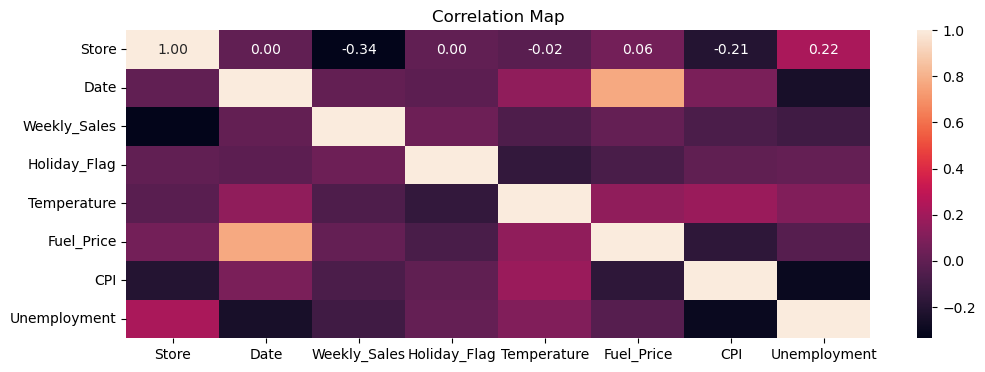

In [12]:
plt.figure(figsize=(12,4))
sns.heatmap(data=df.corr(), annot=True, fmt='.2f')
plt.title('Correlation Map')
plt.show()

#### Insights from the Data

##### Data description

The describe function gives us description of the Dataframe.
1. It gives us the measure of central tendencies for each column like mean, median, mode and Standard deviation.
2. It also provides up the range of the data by giving us the min value and the maximum values for each columns.
3. it gives us the total count of entries in each feature.
4. We can also get the Quantiles of each columns like 25th, 50th and 75th quantiles.

In [13]:
df.describe()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
count,6435.000000,6435,6.435000e+03,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000
mean,23.000000,2011-06-17 00:00:00.000000256,1.046965e+06,0.069930,60.663782,3.358607,171.578394,7.999151
min,1.000000,2010-02-05 00:00:00,2.099862e+05,0.000000,-2.060000,2.472000,126.064000,3.879000
25%,12.000000,2010-10-08 00:00:00,5.533501e+05,0.000000,47.460000,2.933000,131.735000,6.891000
50%,23.000000,2011-06-17 00:00:00,9.607460e+05,0.000000,62.670000,3.445000,182.616521,7.874000
75%,34.000000,2012-02-24 00:00:00,1.420159e+06,0.000000,74.940000,3.735000,212.743293,8.622000
max,45.000000,2012-10-26 00:00:00,3.818686e+06,1.000000,100.140000,4.468000,227.232807,14.313000
std,12.988182,NaN,5.643666e+05,0.255049,18.444933,0.459020,39.356712,1.875885


In [14]:
Total_number_of_weeks = df['Date'].nunique()
Start_date = df['Date'].min()
End_Date = df['Date'].max()
print(f" Total number of weeks in data {Total_number_of_weeks}, First week date of data is {Start_date}, and end week date is {End_Date}")

 Total number of weeks in data 143, First week date of data is 2010-02-05 00:00:00, and end week date is 2012-10-26 00:00:00


In [15]:
from datetime import datetime
df['Year'] = df.Date.dt.year
df['Month'] = df.Date.dt.month
df['Day'] = df.Date.dt.day
df['Week_in_year'] = df.Date.dt.isocalendar().week

In [16]:
df.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Year,Month,Day,Week_in_year
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106,2010,2,5,5
1287,10,2010-02-05,2193048.75,0,54.34,2.962,126.442065,9.765,2010,2,5,5
5148,37,2010-02-05,536006.73,0,45.97,2.572,209.852966,8.554,2010,2,5,5
2288,17,2010-02-05,789036.02,0,23.11,2.666,126.442065,6.548,2010,2,5,5
4147,30,2010-02-05,465108.52,0,39.05,2.572,210.752605,8.324,2010,2,5,5


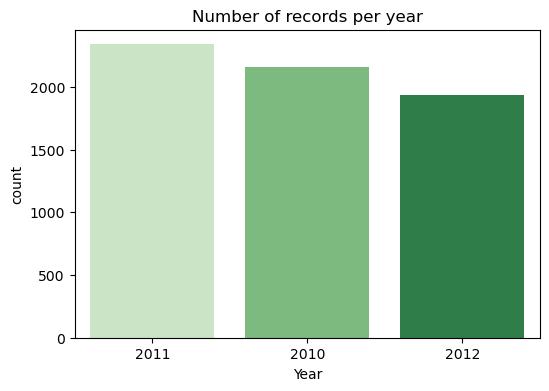

In [17]:
plt.figure(figsize=(6,4))
sns.countplot(data=df, x='Year', order=df['Year'].value_counts().index, palette='Greens')
plt.title('Number of records per year')
plt.show()

In [18]:
days = {0:'Monday',1:'Tuesday',2:'Wednesday',3:'Thursday',4:'Friday',5:'Saturday',6:'Sunday'}
df['Day'] = df['Day'].map(days)

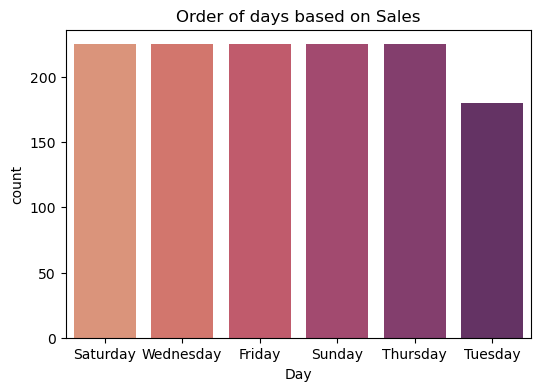

In [19]:
plt.figure(figsize=(6,4))
sns.countplot(data=df, x=df['Day'], order=df['Day'].value_counts().index, palette='flare')
plt.title('Order of days based on Sales')
plt.show()

The days which sees the maximun sales throughout the year are Sundays, Wednesdays and Thursdays. Tuesday however has seen lowest sales

In [20]:
months = {0:'Jan', 1:'Feb',2:'Mar',3:'Apr',4:'May',5:'Jun',6:'Jul',7:'Aug',8:'Sept',9:'Oct',10:'Nov',11:'Dec'}
df['Month'] = df['Month'].map(months)

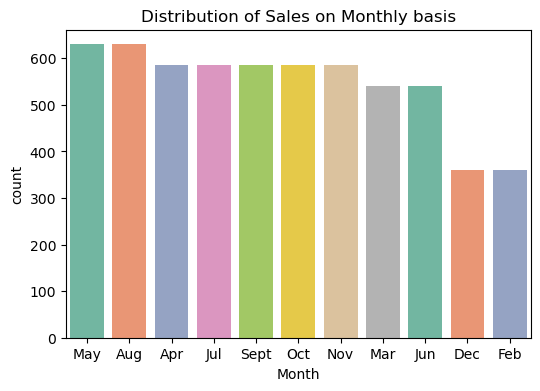

In [21]:
plt.figure(figsize=(6,4))
sns.countplot(data=df, x='Month', order=df['Month'].value_counts().index, palette='Set2')
plt.title('Distribution of Sales on Monthly basis')
plt.show()

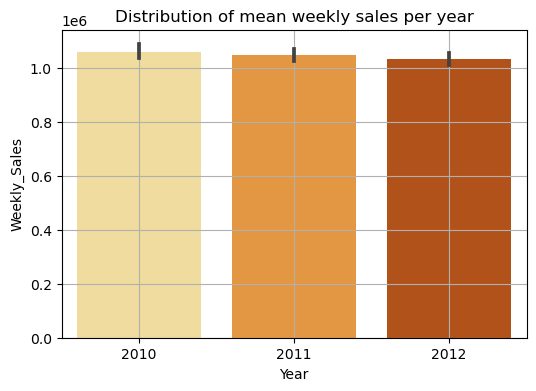

In [22]:
plt.figure(figsize=(6,4))
sns.barplot(data=df, x='Year', y='Weekly_Sales', estimator='mean', palette='YlOrBr')
plt.title('Distribution of mean weekly sales per year')
plt.grid()
plt.show()

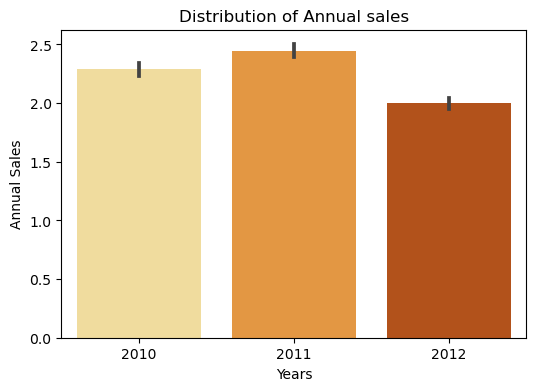

In [23]:
plt.figure(figsize=(6,4))
sns.barplot(data=df, x='Year', y=(df['Weekly_Sales'])/1e9, estimator='sum', palette='YlOrBr')
plt.xlabel('Years')
plt.ylabel('Annual Sales')
plt.title('Distribution of Annual sales')
plt.show()

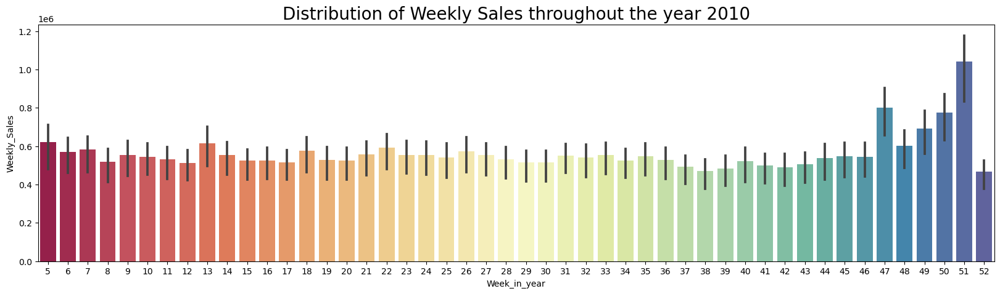

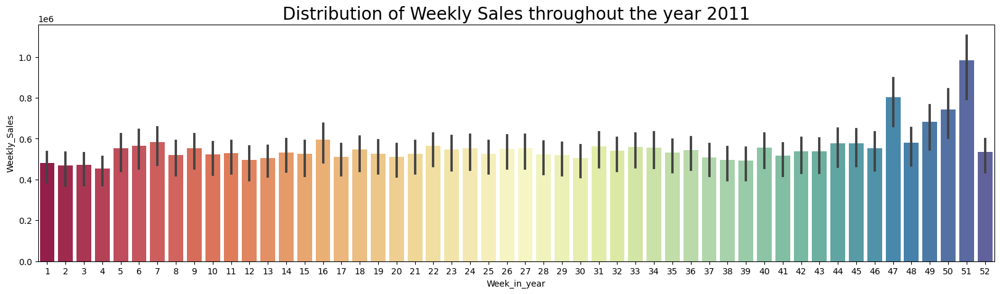

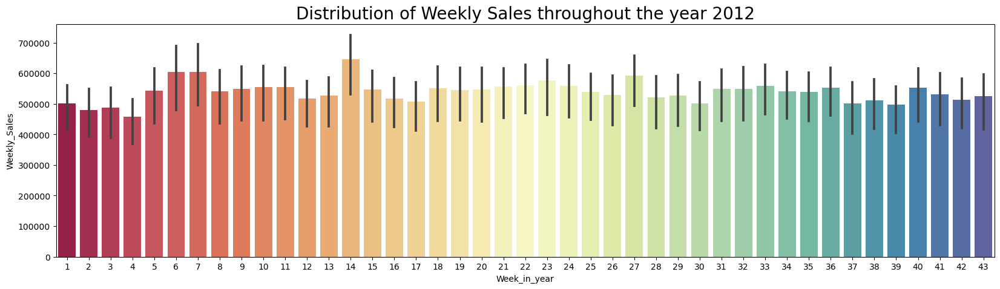

In [24]:
for year in df['Year'].unique():
    year_data = df[df['Year'] == year]
    plt.figure(figsize=(20,5))
    sns.barplot(year_data, x=year_data['Week_in_year'], y='Weekly_Sales', estimator='std', palette='Spectral')
    plt.title(f'Distribution of Weekly Sales throughout the year {year}', fontsize=20)
    plt.show()

##### All the columns and there respective unique entries

In [25]:
print(df.apply(lambda x: x.nunique()))

Store             45
Date             143
Weekly_Sales    6435
Holiday_Flag       2
Temperature     3528
Fuel_Price       892
CPI             2145
Unemployment     349
Year               3
Month             11
Day                6
Week_in_year      52
dtype: int64


## Assumptions

### 1. Does Holidays affect the weekly sales of the stores. List the stores which shows significant change in weekly sales and which does'nt.

On the premise that there are holiday and non-holiday week. We can check if the weekly sales from a holiday week and a non-holiday week have any significant difference on a store-to-store basis. To test this theory we can employ a statistical test. To check if any store has a different outcome.

Before deploying the statistical test we will segregate the data store-wise and split each store's sales into holiday week sales and non holiday week sales. After the test we will save the data in two seperate list of stores which shows significant difference in Sales on week days with respect to Holiday weeks.

We will now formulate the null and alternate hypothesis for the test.

1. Null Hypothesis -- The mean holiday-week Sales do not have any significant difference from non-holiday week.
2. Alternate Hypothesis -- There is a clear difference between the mean sales of holiday week and non-holiday week.
3. Setting the probability threshold for rejecting the null hypothesis will be 95%.
4. We will be using the two-sample t-test to test our hypothesis
5. Decision Rule: If p values if less then alpha we will reject the null hypothesis.

In [26]:
from scipy.stats import ttest_ind

In [27]:
alpha = 0.05 #derived from 95% confidence interval
stores_with_diff = []
stores_without_diff = []

for i in df['Store'].unique():
    store_data = df[df['Store']==i]
    store_holiday = store_data[store_data['Holiday_Flag'] == 1]['Weekly_Sales']
    store_nholiday = store_data[store_data['Holiday_Flag'] == 0]['Weekly_Sales']

    statistic, pvalues = ttest_ind(store_holiday,store_nholiday)
    print('Result of Store:',i,(f'T-Statistic: -- {statistic}',f'P value: -- {pvalues}'))

    if pvalues < alpha:
        print('We reject the null hypothesis. There is a clear difference between the sales of holiday week and non-holiday week.')
        stores_with_diff.append(i)
    else:
        print('We failed to reject the null hypothesis. The mean holiday-week Sales do not have any significant difference from non-holiday week.')
        stores_without_diff.append(i)

print(f'List of Stores with not much difference in weekly sales on holiday and non holiday week:{stores_without_diff}')
print(f'List of stores showing significant difference in weekly sales on holiday week: {stores_with_diff}')

Result of Store: 1 ('T-Statistic: -- 2.359623797138731', 'P value: -- 0.01966448864457083')
We reject the null hypothesis. There is a clear difference between the sales of holiday week and non-holiday week.
Result of Store: 10 ('T-Statistic: -- 2.362317696423828', 'P value: -- 0.019527707018366966')
We reject the null hypothesis. There is a clear difference between the sales of holiday week and non-holiday week.
Result of Store: 37 ('T-Statistic: -- -1.7197824712777423', 'P value: -- 0.08766614776576633')
We failed to reject the null hypothesis. The mean holiday-week Sales do not have any significant difference from non-holiday week.
Result of Store: 17 ('T-Statistic: -- 2.569700671587273', 'P value: -- 0.01121679100755154')
We reject the null hypothesis. There is a clear difference between the sales of holiday week and non-holiday week.
Result of Store: 30 ('T-Statistic: -- -0.2464839963607223', 'P value: -- 0.8056660720293681')
We failed to reject the null hypothesis. The mean holida

6. Conclusion -- There is clear evidence that in case of majority of cases(Stores) the sales on holiday week is very much different then the sales of non holiday week. But there are those cases where the holiday sales did not make much difference. List of both the store which lies under both cases are below.

    1.   Stores where sales affected (37, 30, 25, 22, 23, 21, 39, 32, 13, 38, 45, 20, 27, 41, 4, 16, 11, 36, 42, 43, 6, 33, 44, 18, 40, 14)
    2.   Stores where holiday didn't affect sales (1, 10, 17, 24, 19, 26, 8, 15, 34, 9, 2, 31, 5, 35, 28, 3, 12, 29, 7)

Comparing weekly sales across all stores with respect to holiday and non holiday week

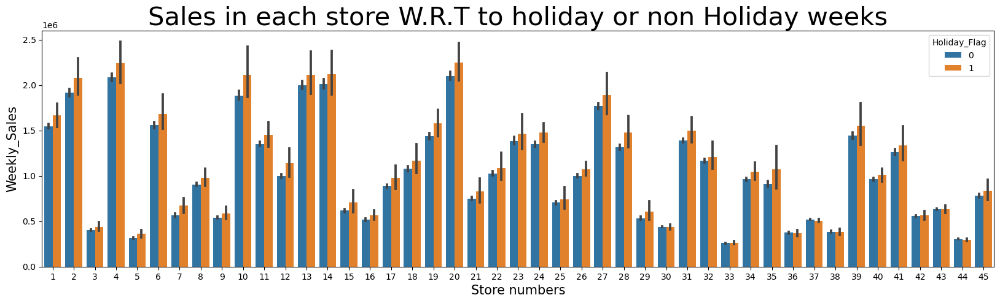

In [28]:
plt.figure(figsize=(20,5))
sns.barplot(data=df, x=df['Store'], y= df['Weekly_Sales'], hue=df['Holiday_Flag'].astype('str'))
plt.title('Sales in each store W.R.T to holiday or non Holiday weeks', fontsize=30)
plt.xlabel('Store numbers',fontsize=15)
plt.ylabel(f'Weekly_Sales', fontsize=15)
plt.show()

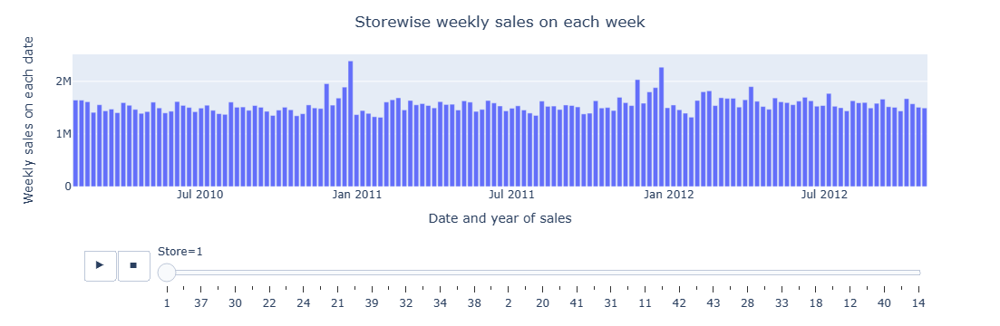

In [29]:
import plotly.express as px

custom_width = 1100
fig = px.bar(data_frame=df, x='Date', y='Weekly_Sales',animation_frame='Store',width=custom_width)
fig.update_layout(
    title = 'Storewise weekly sales on each week',
    xaxis_title = 'Date and year of sales',
    yaxis_title = 'Weekly sales on each date',
    title_x = 0.5
)
fig.show()

#### 5. Checking for distribution of data.

Regression algorithms rely on the assumption that the data adheres to a normal distribution. Therefore, we recommend checking whether a feature conforms to the Gaussian Distribution. If the feature does not align with the normal distribution, transformation techniques can be applied to achieve a normal distribution for the feature.

In [30]:
col_list = [col for col in df.select_dtypes(include='float64') if col != 'Weekly_Sales']
col_list

['Temperature', 'Fuel_Price', 'CPI', 'Unemployment']

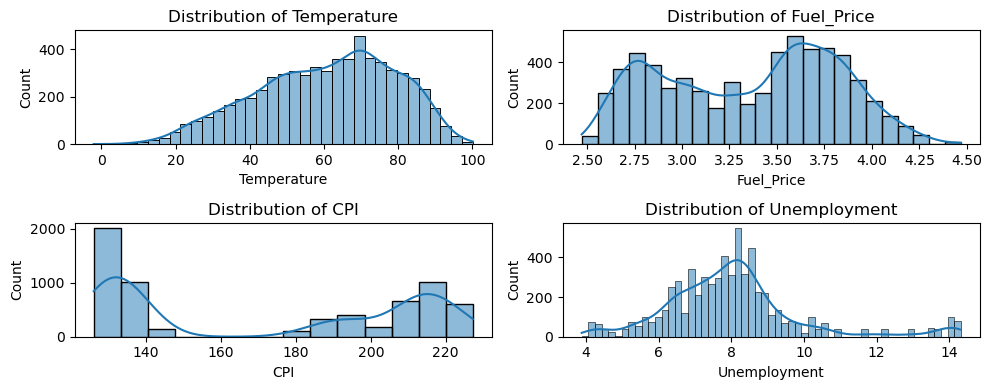

In [31]:
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(10,4))
ax = ax.flatten()
for i, col in enumerate(col_list):
    sns.histplot(data=df,x=col, kde=True, ax=ax[i])
    ax[i].set_title(f'Distribution of {col}')
    ax[i].set_xlabel(col)
plt.tight_layout()
plt.show()

The fuel price column doesn't follow a normal distribution which typically suggests that:
1. Data doesn't originate from a single homogenous population.
2. It implies the presence of multiple subpopulations.
3. Possibility of seasonal variations where prices tend to be higher at a certain period.

Statistical transformation techniques can be applied to make it appear normally distributed. Techniques like box-cox transformation, square-root transformation, and logarithmic transformation.

Here we are doing the boxcox transformation for the skewed feature columns using boxcox from [scipy.stats library.](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.boxcox.html)

First we will check for the actual skewness of the related features.

In [32]:
col_list = [col for col in df.select_dtypes(include='float64')if col != 'Weekly_Sales']
for col in col_list:
    skewed_feature = df[col]
    original_skewness = skewed_feature.skew()
    print(f"Original Skewness of {col}:",original_skewness)

Original Skewness of Temperature: -0.33676760110757864
Original Skewness of Fuel_Price: -0.09615830011864966
Original Skewness of CPI: 0.06349184988549489
Original Skewness of Unemployment: 1.1881439334843258


As Temprature has negative values we will deal with it seperately.


In [33]:
from scipy.stats import boxcox
skewed_feature = df['Temperature']
constant = abs(df['Temperature'].min()) + 0.01
transformed_feature, lambda_value = boxcox(skewed_feature + constant)

df['Temperature'] = transformed_feature
transformed_skewness = df['Temperature'].skew()
print('Skewness of transformed Temprature:',transformed_skewness)

Skewness of transformed Temprature: -0.14189193569343064


In [34]:
col_list = [col for col in df.select_dtypes(include='float64')if (col != 'Weekly_Sales')&(col!= 'Temperature')]
for col in col_list:
    skewed_feature = df[col]
    transformed_feature, lambda_value = boxcox(skewed_feature)
    df[col] = transformed_feature
    transformed_skewness = df[col].skew()
    print(f'Skewness of transformed {col}:',transformed_skewness)

Skewness of transformed Fuel_Price: -0.0661260306163927
Skewness of transformed CPI: 0.010267940912768088
Skewness of transformed Unemployment: -0.009649663119137654


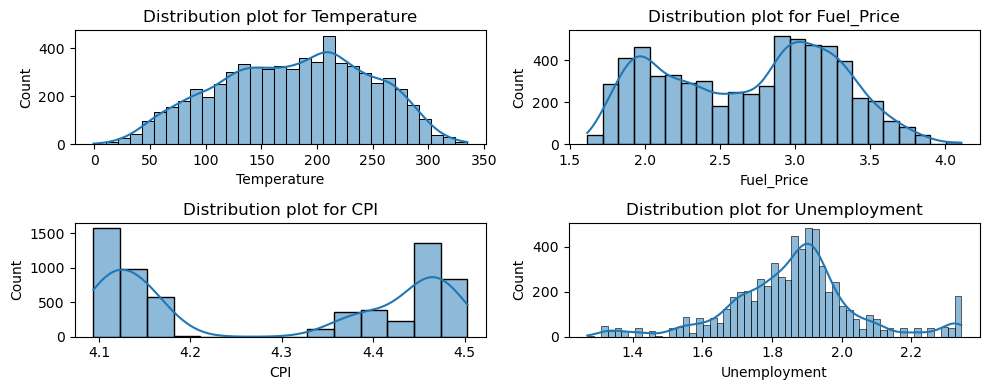

In [35]:
col_list = [col for col in df.select_dtypes(include='float64')if col != 'Weekly_Sales']
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(10,4))
ax = ax.flatten()
for i,col in enumerate(col_list):
    sns.histplot(data=df,x=col, kde=True, ax=ax[i])
    ax[i].set_title(f'Distribution plot for {col}')
    ax[i].set_xlabel(col)

plt.tight_layout()
plt.show()

#### 6. Checking the data for potential outliers

We will use boxplot from seaborn library to check for potential outliers in the continuous features of the data.







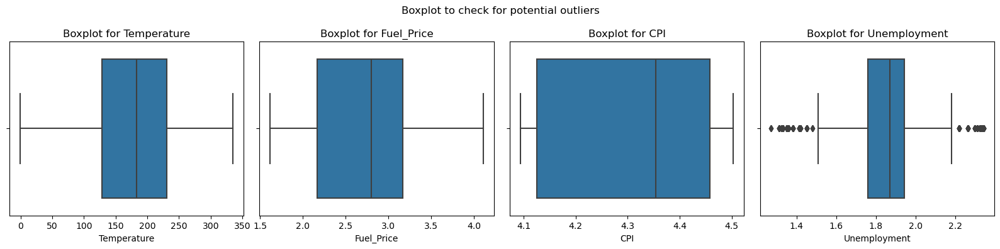

In [36]:
col_list = [col for col in df.select_dtypes(include='float64') if col != 'Weekly_Sales']
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(16,4))
for i, col in enumerate(col_list):
    sns.boxplot(data=df, x=col, ax=ax[i], orient='v')
    ax[i].set_title(f'Boxplot for {col}')
fig.suptitle('Boxplot to check for potential outliers')
plt.tight_layout()
plt.show()

#### Model Evaluation and techniques for time series

1. Using tools like autocorrelation and partial auto-correlation plots to understand the data's characteristics and to identify patterns, trends, and seasonality.
2. Decompose the time series into its components -- trends, seasonality using methods like additive or multiplicative decomposition.
3. Checking for stationarity in data which implies that data remains the same overtime. Stationarity is tested by using the Augmented Dickey-Fuller test. In case the data is not stationary we apply transformation techniques like differencing to remove trends or using log transformation to achieve stationarity.
4. We can the select appropriate model based on the characteristics of the data.

In [37]:
data = walmart.copy(deep=True)
data.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106


**Plot for storewise weekly sales trend.**

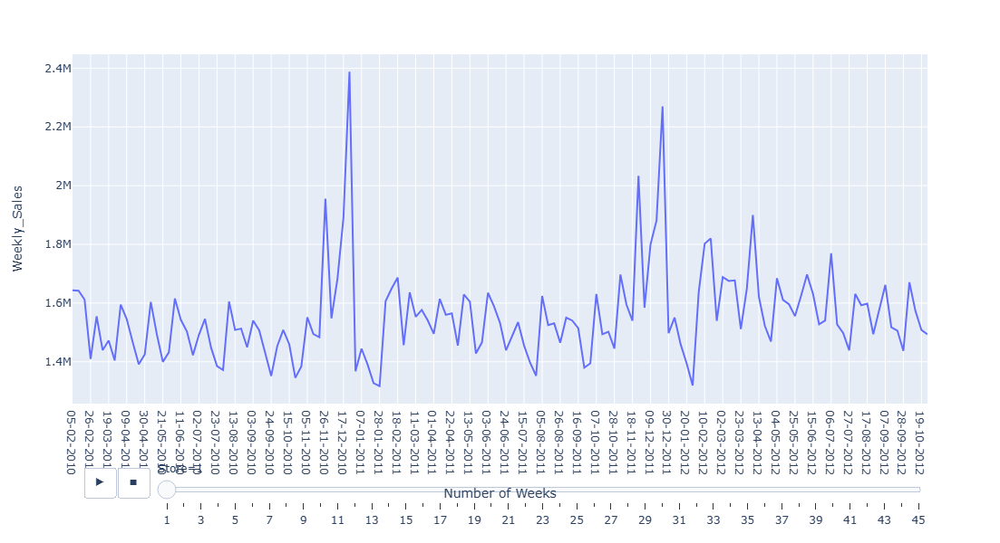

In [38]:
fig = px.line(data_frame=data, x='Date', y='Weekly_Sales',animation_frame='Store',height=600, width=1100,labels={'Date': 'Number of Weeks'})
fig.show()

Any time series has three components.
1. Trend.
2. Seasonality/Cyclicality.
3. Residue.

For time series data, we should identify these three things. Once we have identified these components, we can remove trends and seasonality. Now we are left with residue will be explained using some mathematics. We now use explained components for forecasting.

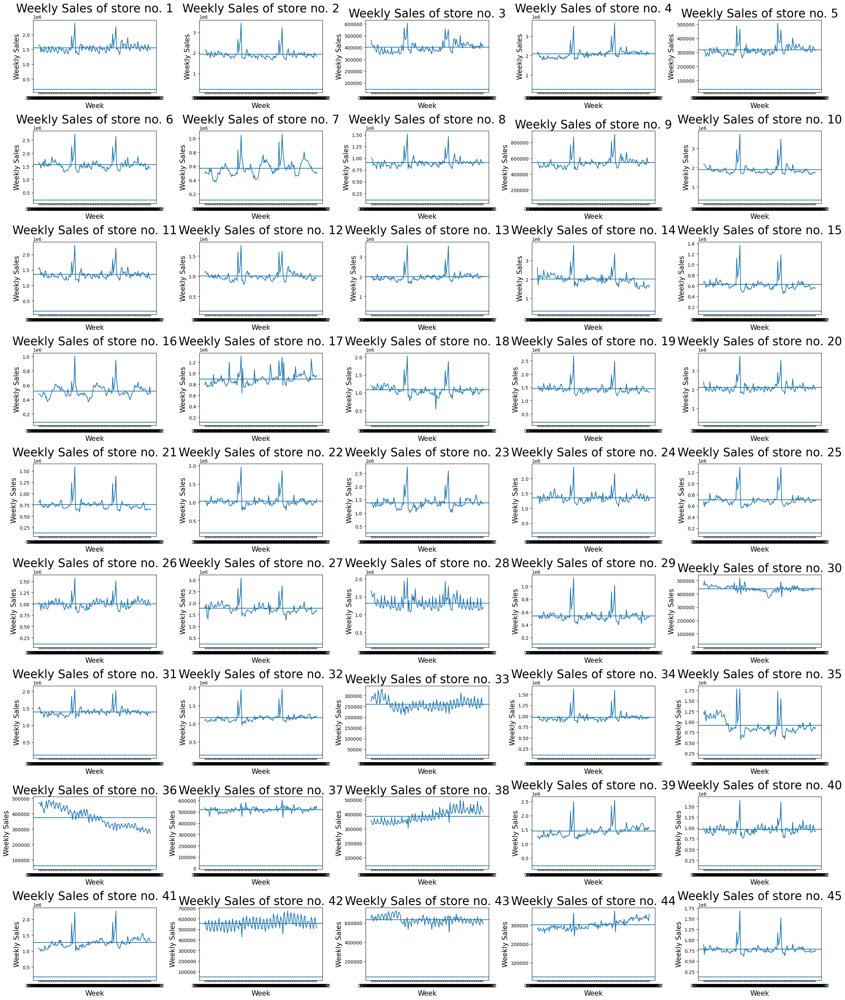

In [39]:
fig, ax = plt.subplots(nrows=9, ncols=5, figsize=(25,30))
ax = ax.flatten()
for i,store in enumerate(data['Store'].unique()):
    store_data = data[data['Store'] == store]
    sns.lineplot(data=store_data, x='Date', y='Weekly_Sales',estimator='mean',ax= ax[i])
    ax[i].axhline(store_data['Weekly_Sales'].mean())
    ax[i].axhline(store_data['Weekly_Sales'].std())
    ax[i].set_title(f'Weekly Sales of store no. {store}',fontsize=25)
    ax[i].set_xlabel('Week',fontsize=15)
    ax[i].set_ylabel('Weekly Sales',fontsize=15)
plt.tight_layout()
plt.show()

As we can see that there are no trends in the data for each store except for these stores 30,36,38,40,43,44. Although we can see the yearly seasonality in all of them.

Now that we have a rough idea about the overall trends and seasonality of sales data across all stores. Let's confirm the same with a Augmented Dickey-Fuller test. In order to perform a statistical test we need to first formulate Hypothesis about the data.

#### Formulating the hypothesis

1. Null Hypothesis -- The data has a unit root (Non-Stationary).
2. Alternate hypothesis -- The data has no unit root (Stationary).
3. If Test Statistic is less then the Critical values we will reject the null hypothesis.
4. We will use adfuller test from statsmodel library.
5. Decision Rule: If Test Statistic is less then the critical values we will reject the null hypothesis.

In [40]:
df1 = data[['Date','Weekly_Sales','Store']]
df1.index = df1['Date']
df1.drop('Date',axis=1, inplace=True)

##### Lets check data as a whole if it has unit root or not.

In [41]:
from statsmodels.tsa.stattools import adfuller
Adf_test = adfuller(df1['Weekly_Sales'])
print('Test Statistic:', Adf_test[0],'\n',
     'P-Value:', Adf_test[1],'\n',
     'Critical Values:', Adf_test[4])
values = [value for key, value in Adf_test[4].items()]
if all(Adf_test[0] < value for value in values):
    print('We reject the null hypothesis. The data has no unit root.(Stationary)')
else:
    print('We failed to reject the null hypothesis. The data has unit root.(Non Stationary)')

Test Statistic: -4.624149498578299 
 P-Value: 0.00011655869699901492 
 Critical Values: {'1%': -3.4313721757424656, '5%': -2.8619917128968813, '10%': -2.5670104435791017}
We reject the null hypothesis. The data has no unit root.(Stationary)


**6. Conclusion.**
From the above test we can infer that the data has no unit root i.e., the data as a whole is stationary. But as we have seen that after splitting the data storewise we see some trends and yearly seasonality.

We will split the data storewise and do statistical analysis to see if data related to each store is stationary or not. We will use same hypothesis used for whole data.
1. Null Hypothesis -- The data has a unit root (Non-Stationary).
2. Alternate hypothesis -- The data has no unit root (Stationary).
3. If Test Statistic is less then the Critical values we will reject the null hypothesis.
4. We will use adfuller test from statsmodel library.
5. Decision Rule: If Test Statistic is less then the critical values we will reject the null hypothesis.

In [42]:
from statsmodels.tsa.stattools import adfuller

non_stationalry_stores = []
stationary_stores = []

for stor in df1['Store'].unique():
    store_data = df1[df1['Store'] == stor]
    result = adfuller(store_data['Weekly_Sales'])
    print(f' P-Value: {result[1]}')
    for key, value in result[4].items():
        print(f'Critical Values {key}: {value}, Test Statistic: {result[0]}')

    if result[0] < value:
        print(f'For the Store number {stor}: We reject the null hypothesis, The data has no unit root, (Stationary)','\n')
        stationary_stores.append(stor)
    else:
        print(f'For the Store number {stor}: We failed to reject the null hypothesis, The data has unit root, (Non-stationary)','\n')
        non_stationalry_stores.append(stor)

 P-Value: 1.3877788330759535e-05
Critical Values 1%: -3.47864788917503, Test Statistic: -5.102186145192286
Critical Values 5%: -2.882721765644168, Test Statistic: -5.102186145192286
Critical Values 10%: -2.578065326612056, Test Statistic: -5.102186145192286
For the Store number 1: We reject the null hypothesis, The data has no unit root, (Stationary) 

 P-Value: 0.0039902070890662795
Critical Values 1%: -3.4793722137854926, Test Statistic: -3.708862572618915
Critical Values 5%: -2.8830370378332995, Test Statistic: -3.708862572618915
Critical Values 10%: -2.578233635380623, Test Statistic: -3.708862572618915
For the Store number 2: We reject the null hypothesis, The data has no unit root, (Stationary) 

 P-Value: 0.038409261798312666
Critical Values 1%: -3.4793722137854926, Test Statistic: -2.963867745511322
Critical Values 5%: -2.8830370378332995, Test Statistic: -2.963867745511322
Critical Values 10%: -2.578233635380623, Test Statistic: -2.963867745511322
For the Store number 3: We re

In [43]:
print('Stores with non-stationary data',non_stationalry_stores)
print('Stores with stationary data',stationary_stores)

Stores with non-stationary data [30, 36, 38, 42, 43, 44]
Stores with stationary data [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 37, 39, 40, 41, 45]


##### 6. Conclusion:
From the above test we can conclude that out of 45 stores weekly sales data, 40 stores have stationary data, and the rest 5 stores sales data are not stationary. Which means there is some element of trends and seasonality in it.

Now that we have confirmed our suspision that there are elements of trend and seasonality in the data. We can now move forward and build our forcasting model. For the purpose of forcasting we will be using Facebook forcasting library called fbprophet.

# Building Forcasting Model using Facebook prophet library.

Making a Copy of oiginal data for forecasting. We will only select one feature from the original data as fbprophet take only two input date (ds) and target (y).

In [44]:
data = walmart.copy(deep=True)
data['Date'] = pd.to_datetime(data['Date'],format="%d-%m-%Y", dayfirst=True)

Renaming the columns to match the fbprophets requirenment.

In [45]:
forcasting = data.loc[:, ['Date','Weekly_Sales']]
forcasting.rename(columns={'Date': 'ds', 'Weekly_Sales': 'y'}, inplace=True)

forcasting.head()

,ds,y
0,2010-02-05,1643690.90
1,2010-02-12,1641957.44
2,2010-02-19,1611968.17
3,2010-02-26,1409727.59
4,2010-03-05,1554806.68


In [46]:
from prophet import Prophet
import logging
logger = logging.getLogger('cmdstanpy')
logger.addHandler(logging.NullHandler())
logger.propagate = False
logger.setLevel(logging.CRITICAL)

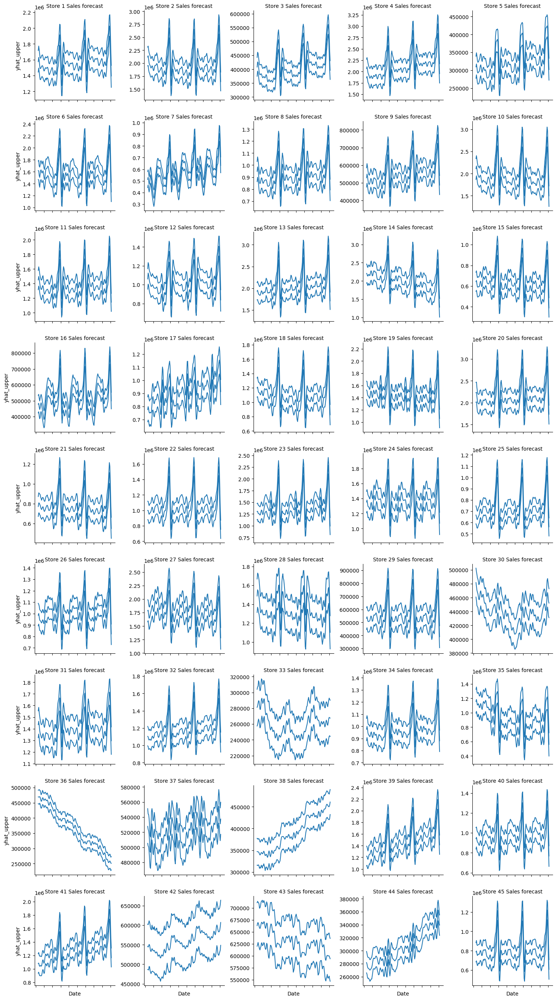

In [47]:
all_forecast = []
for store in data['Store'].unique():
    store_data = data[data['Store'] == store]
    forcasting = store_data.loc[:, ['Date','Weekly_Sales']]
    forcasting.rename(columns={'Date': 'ds', 'Weekly_Sales': 'y'}, inplace=True)

    model = Prophet(yearly_seasonality=True,weekly_seasonality=False,daily_seasonality=False)
    model.fit(forcasting)

    future_dates = model.make_future_dataframe(periods=12,freq="W")
    prediction = model.predict(future_dates)
    forcasted_data = prediction[['ds','yhat','yhat_lower','yhat_upper']]

    forcasted_data['Store'] = store
    all_forecast.append(forcasted_data)

all_forecast_df = pd.concat(all_forecast)
grid = sns.FacetGrid(data=all_forecast_df, col='Store',col_wrap=5, height=3, sharey=False)
grid.map_dataframe(sns.lineplot, x='ds',y='yhat',ax=grid.axes)
grid.map_dataframe(sns.lineplot, x='ds', y='yhat_lower', ax=grid.axes)
grid.map_dataframe(sns.lineplot, x='ds', y='yhat_upper', ax=grid.axes)

grid.set_xlabels('Date')
grid.set_titles('Store {col_name} Sales forecast')
grid.set_xticklabels(rotation=75)
grid.tight_layout()
plt.show()

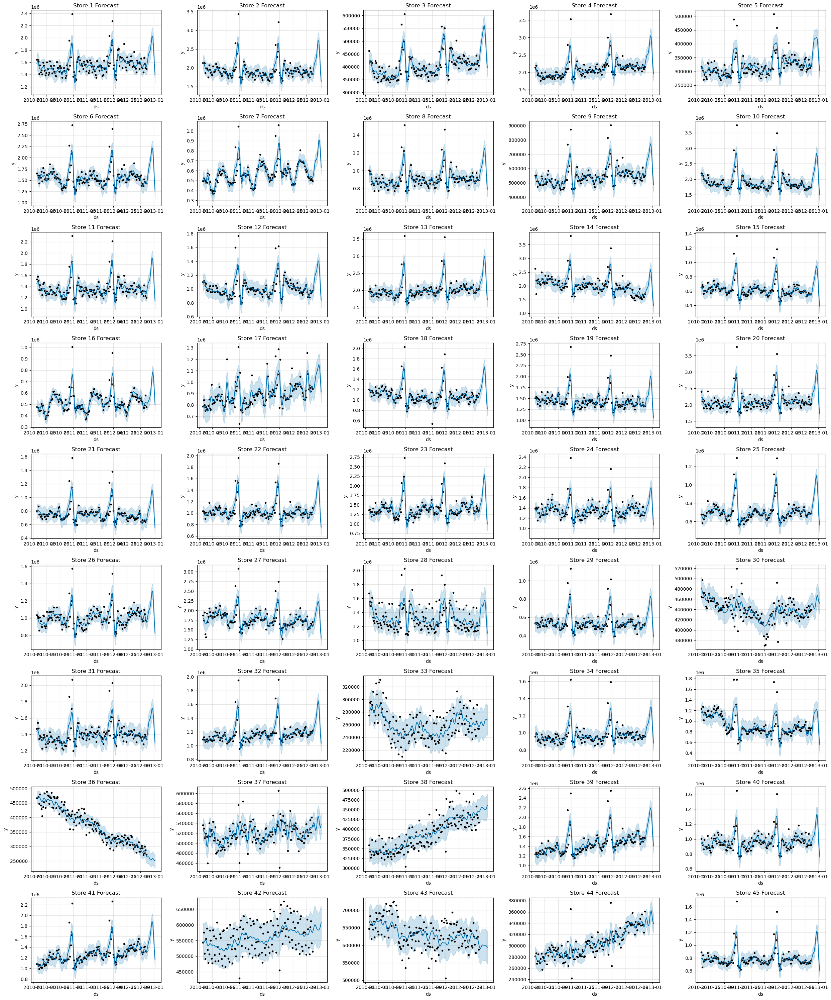

In [48]:
all_forecast = []

num_stores = len(data['Store'].unique())
rows = 9
cols = 5

fig, axes = plt.subplots(rows, cols, figsize=(25, 30))
axes = axes.flatten()

for i, store in enumerate(data['Store'].unique()):
    store_data = data[data['Store'] == store]
    forcasting = store_data.loc[:, ['Date', 'Weekly_Sales']]
    forcasting.rename(columns={'Date': 'ds', 'Weekly_Sales': 'y'}, inplace=True)

    model = Prophet(yearly_seasonality=True, weekly_seasonality=False, daily_seasonality=False)
    model.fit(forcasting)
    future_dates = model.make_future_dataframe(periods=12, freq="W")
    prediction = model.predict(future_dates)

    model.plot(prediction, ax=axes[i])
    axes[i].set_title(f"Store {store} Forecast")

plt.tight_layout()
plt.show()

Making a Dataframe with original and forcasted dates and sales value.

In [49]:
all_forecast_df.tail()

,ds,yhat,yhat_lower,yhat_upper,Store
150,2012-12-16,1.218938e+06,1.119337e+06,1.320786e+06,45
151,2012-12-23,1.201042e+06,1.097802e+06,1.299346e+06,45
152,2012-12-30,1.022328e+06,9.185430e+05,1.132592e+06,45
153,2013-01-06,7.754996e+05,6.751033e+05,8.786795e+05,45
154,2013-01-13,6.073274e+05,5.058676e+05,7.070182e+05,45


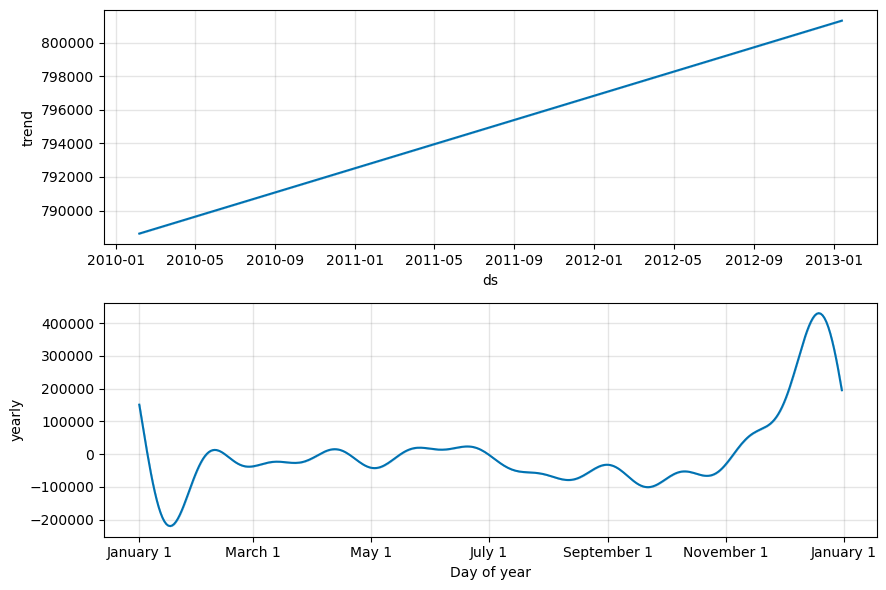

In [50]:
model.plot_components(prediction);

## Building Prediction models:


**We will now make a regression models for future sales value prediction based on the given data. We will use 70:30 split of original data as training and testing set.**

Our main aim is to reduce the mean squared error of the testing set.

### Linear Regression Model

In [51]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [52]:
df.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Year,Month,Day,Week_in_year
0,1,2010-02-05,1643690.90,0,111.211592,1.735701,4.452975,1.892331,2010,Mar,Saturday,5
1287,10,2010-02-05,2193048.75,0,152.788666,2.203800,4.095995,2.042692,2010,Mar,Saturday,5
5148,37,2010-02-05,536006.73,0,123.524250,1.735701,4.448934,1.936053,2010,Mar,Saturday,5
2288,17,2010-02-05,789036.02,0,52.337793,1.847430,4.095995,1.716567,2010,Mar,Saturday,5
4147,30,2010-02-05,465108.52,0,100.511381,1.735701,4.451860,1.913929,2010,Mar,Saturday,5


In [53]:
X = df.drop(columns=['Weekly_Sales','Date','Year','Month','Day','Week_in_year']) #dropping target and created columns previously for visualization
y = df['Weekly_Sales']

In [54]:
scale = StandardScaler()
X = scale.fit_transform(X)
y = scale.fit_transform(y.values.reshape(-1,1))

In [55]:
pca = PCA(n_components=3)
X = pca.fit_transform(X)

In [56]:
pca.explained_variance_ratio_

array([0.24403914, 0.2085206 , 0.17393894])

In [57]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [58]:
reg = LinearRegression()
reg.fit(X_train, y_train)
pred = reg.predict(X_test)
print(mean_squared_error(y_test, pred), r2_score(y_test, pred))

0.9532077641881911 0.0493273337163751


The R2 score or R Squared error represents the proportion of the variance in the dependent variables that is predicted from the independent variable. The R Squared error of 0.0493 tells us that only 4.93 percent variance is explained by the model. Hence the model performed very poorly.

### Linear Regression Model for each store

We will make number of regressio models to predict the weekly sales for each store and compare which model gives beat result.
1. Linear Regression.
2. Random Forest Regressor.
3. Gradient boosting Adaboost

In [59]:
for store in data['Store'].unique():
    store_data = data[data['Store']== store]
    X = store_data.drop(columns=['Weekly_Sales','Date'])
    y = store_data['Weekly_Sales']
    scale = StandardScaler()
    X = scale.fit_transform(X)
    y = scale.fit_transform(y.values.reshape(-1,1))
    pca = PCA(n_components=3)
    X = pca.fit_transform(X)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    lin_reg = LinearRegression()
    lin_reg.fit(X_train,y_train)
    y_pred = lin_reg.predict(X_test)
    mae = mean_absolute_error(y_true=y_test, y_pred=y_pred)
    mse = mean_squared_error(y_true=y_test, y_pred=y_pred)
    rmse = np.sqrt(mse)
    r_squared = r2_score(y_true=y_test, y_pred=y_pred)
    print(f'Store {store} Mean Absolute Error: {mae},')
    print(f'Store {store} Mean Squared Error: {mse},')
    print(f'Store {store} Root Mean Squared Error {rmse},')
    print(f'Store {store} R Squared error {r_squared}\n')

Store 1 Mean Absolute Error: 0.7753818820236678,
Store 1 Mean Squared Error: 1.431206131877064,
Store 1 Root Mean Squared Error 1.1963302770878383,
Store 1 R Squared error -0.0445134567134291

Store 2 Mean Absolute Error: 0.7320727918409187,
Store 2 Mean Squared Error: 1.5561671715512484,
Store 2 Root Mean Squared Error 1.2474642967040173,
Store 2 R Squared error -0.01574179681337018

Store 3 Mean Absolute Error: 0.7766373969810779,
Store 3 Mean Squared Error: 1.3005241010594237,
Store 3 Root Mean Squared Error 1.14040523545774,
Store 3 R Squared error 0.16032733183336

Store 4 Mean Absolute Error: 0.7222079599121163,
Store 4 Mean Squared Error: 1.676889920344288,
Store 4 Root Mean Squared Error 1.2949478446425122,
Store 4 R Squared error 0.11145873530952333

Store 5 Mean Absolute Error: 0.7360192993117535,
Store 5 Mean Squared Error: 1.7402643752257667,
Store 5 Root Mean Squared Error 1.3191908031917774,
Store 5 R Squared error -8.35616694510044e-05

Store 6 Mean Absolute Error: 0.809

For almost every store the model performed very poorly and it did not predict the proportion variance in dependent variable except for store no 36 where the model explained almost 82% of variance. Also the mean squared error is considerably low of 17%. Hence the overall model performance is unsatisfactory.

In [60]:
from sklearn.ensemble import RandomForestRegressor

**Feature Selection Based on Random Forest Regressor**

In [61]:
X = df.drop(columns=['Weekly_Sales','Date','Year','Month','Day','Week_in_year'])
y = df['Weekly_Sales']

In [62]:
rfre = RandomForestRegressor(n_estimators=100, max_depth=5)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
X_train = scale.fit_transform(X_train)
X_test = scale.transform(X_test)
rfre.fit(X_train,y_train)
score = rfre.feature_importances_
threshold = 0.05
important_features = [importance > threshold for importance in score]
features_keep = [index for index, value in enumerate(important_features) if value]
X_new = X.iloc[:,features_keep]

### Random Forest Regression Model for each store

In [63]:
for store in data['Store'].unique():
    store_data = data[data['Store'] == store]
    X = store_data.drop(columns=['Weekly_Sales','Date'])
    y = store_data['Weekly_Sales']
    scale = StandardScaler()
    X = scale.fit_transform(X)
    y = scale.fit_transform(y.values.reshape(-1,1))
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    rfr = RandomForestRegressor()
    rfr.fit(X_train, y_train)
    y_pred = (rfr.predict(X_test))
    mae = mean_absolute_error(y_true=y_test, y_pred=y_pred)
    mse = mean_squared_error(y_true=y_test, y_pred=y_pred)
    rmse = np.sqrt(mse)
    r_squared = r2_score(y_true=y_test, y_pred=y_pred)
    print(f'Store {store} Mean Absolute Error: {mae},')
    print(f'Store {store} Mean Squared Error: {mse},')
    print(f'Store {store} Root Mean Squared Error {rmse},')
    print(f'Store {store} R Squared error {r_squared}\n')

Store 1 Mean Absolute Error: 0.7913916476696479,
Store 1 Mean Squared Error: 1.4393113728522413,
Store 1 Root Mean Squared Error 1.199713037710369,
Store 1 R Squared error -0.050428770433734504

Store 2 Mean Absolute Error: 0.6189986954449752,
Store 2 Mean Squared Error: 1.4551940957324085,
Store 2 Root Mean Squared Error 1.2063142607680672,
Store 2 R Squared error 0.05016537263280363

Store 3 Mean Absolute Error: 0.7341977434069648,
Store 3 Mean Squared Error: 1.2551347961944206,
Store 3 Root Mean Squared Error 1.1203279859908974,
Store 3 R Squared error 0.18963256246398008

Store 4 Mean Absolute Error: 0.6515489215951961,
Store 4 Mean Squared Error: 1.6158446459737283,
Store 4 Root Mean Squared Error 1.2711587807877223,
Store 4 R Squared error 0.14380507160419054

Store 5 Mean Absolute Error: 0.6997500960877711,
Store 5 Mean Squared Error: 1.6401148625930482,
Store 5 Root Mean Squared Error 1.2806696930095005,
Store 5 R Squared error 0.05746969444440542

Store 6 Mean Absolute Error: 

### Simple Neural Network model for prediction.

Lets see if Simple neural network gets the prediction anywhere close to original values

In [64]:
X = df.drop(columns=['Weekly_Sales','Date','Year','Month','Day','Week_in_year'])
y = df['Weekly_Sales']

In [65]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [66]:
X_train_transformed = scale.fit_transform(X_train)
X_test_transformed = scale.transform(X_test)
y_train_transformed = scale.fit_transform(y_train.values.reshape(-1,1))
y_test_transformed = scale.transform(y_test.values.reshape(-1,1))

In [67]:
X_train.shape

(4504, 6)

In [79]:
from tensorflow.keras.models import Sequential, save_model
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.activations import linear, relu, tanh
from tensorflow.keras.metrics import mean_squared_error, MeanSquaredError
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.compat.v1.losses import sparse_softmax_cross_entropy
from tensorflow.compat.v1 import get_default_graph

In [92]:
model = Sequential()
model.add(Input(shape=X_train.shape[1]))
model.add(Dense(units=12, activation='relu'))
model.add(Dense(units=32, activation='relu'))
model.add(Dense(units=32, activation='relu'))
model.add(Dense(units=1, activation='linear'))
model.compile(optimizer=Adam(learning_rate=0.00149, weight_decay=0.000002),loss='mean_squared_error', metrics=[MeanSquaredError()])

In [93]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_8 (Dense)             (None, 12)                84        
                                                                 
 dense_9 (Dense)             (None, 32)                416       
                                                                 
 dense_10 (Dense)            (None, 32)                1056      
                                                                 
 dense_11 (Dense)            (None, 1)                 33        
                                                                 
Total params: 1589 (6.21 KB)
Trainable params: 1589 (6.21 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [94]:
model.fit(x=X_train_transformed, y=y_train_transformed,batch_size=100 ,epochs=300, validation_data=(X_test_transformed, y_test_transformed))

Epoch 1/300
46/46 [==============================] - 1s 5ms/step - loss: 0.9180 - mean_squared_error: 0.9180 - val_loss: 0.8476 - val_mean_squared_error: 0.8476
Epoch 2/300
46/46 [==============================] - 0s 4ms/step - loss: 0.8226 - mean_squared_error: 0.8226 - val_loss: 0.7859 - val_mean_squared_error: 0.7859
Epoch 3/300
46/46 [==============================] - 0s 2ms/step - loss: 0.7692 - mean_squared_error: 0.7692 - val_loss: 0.7454 - val_mean_squared_error: 0.7454
Epoch 4/300
46/46 [==============================] - 0s 3ms/step - loss: 0.7333 - mean_squared_error: 0.7333 - val_loss: 0.7075 - val_mean_squared_error: 0.7075
Epoch 5/300
46/46 [==============================] - 0s 3ms/step - loss: 0.7103 - mean_squared_error: 0.7103 - val_loss: 0.6940 - val_mean_squared_error: 0.6940
Epoch 6/300
46/46 [==============================] - 0s 2ms/step - loss: 0.6922 - mean_squared_error: 0.6922 - val_loss: 0.6911 - val_mean_squared_error: 0.6911
Epoch 7/300
46/46 [===============

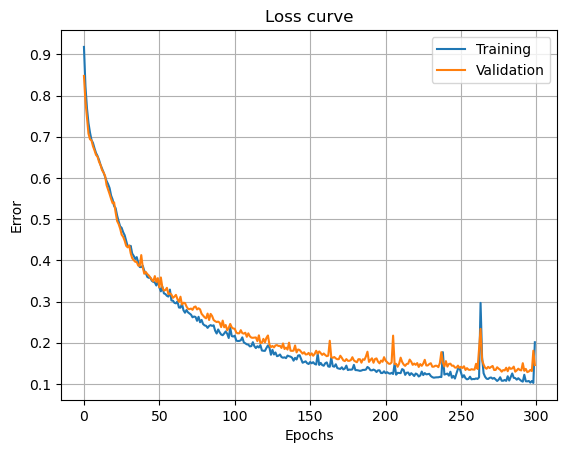

In [95]:
history = model.history.history
Training_Loss = history['loss']
Validation_loss = history['val_loss']

plt.plot(Training_Loss)
plt.plot(Validation_loss)
plt.title('Loss curve')
plt.xlabel('Epochs')
plt.ylabel('Error')
plt.legend(['Training','Validation'])
plt.grid()
plt.show()

In [96]:
pred = model.predict(X_test_transformed)

61/61 [==============================] - 0s 1ms/step


In [97]:
y_pred = pred.flatten()

In [98]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
print('Mean Squared error:', mean_squared_error(y_true=y_test_transformed, y_pred=y_pred))
print('Root Mean Squared error:', np.sqrt(mean_squared_error(y_true=y_test_transformed, y_pred=y_pred)))
print('Mean Absolute error:', mean_absolute_error(y_true=y_test_transformed, y_pred=y_pred))
print('Mean Absolute percentage error:',mean_absolute_percentage_error(y_true=y_test_transformed, y_pred=y_pred))
print('R Squared Error:',r2_score(y_true=y_test_transformed, y_pred=y_pred))

Mean Squared error: 0.1457713329451344
Root Mean Squared error: 0.3818001217196432
Mean Absolute error: 0.24245449889436554
Mean Absolute percentage error: 0.6768036515327303
R Squared Error: 0.8548064072965337


In [99]:
y_pred_transformed = scale.inverse_transform(pred)

In [100]:
diff = pd.DataFrame(np.column_stack((y_test,y_pred_transformed.reshape(-1,1))), columns=['Original','Predicted'])

In [101]:
diff['Predicted'] = np.round(diff['Predicted'])
diff.head()

,Original,Predicted
0,1709365.19,1633454.0
1,262717.71,118241.0
2,494145.80,693471.0
3,726422.55,561504.0
4,1620839.34,1581258.0
